In [47]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [48]:
data = pd.read_csv('data\part_1\historical_weather_cleaned.csv')
data["date"] = pd.to_datetime(data["date"])
data.head(10)

,date,city_id,avg_temp_c
0,2014-01-01,C001,6.6
1,2014-01-02,C001,9.3
2,2014-01-03,C001,7.6
3,2014-01-04,C001,7.6
4,2014-01-05,C001,8.6
5,2014-01-06,C001,9.1
6,2014-01-07,C001,8.8
7,2014-01-08,C001,8.8
8,2014-01-09,C001,9.9
9,2014-01-10,C001,10.8


## Data Distribution Visualization

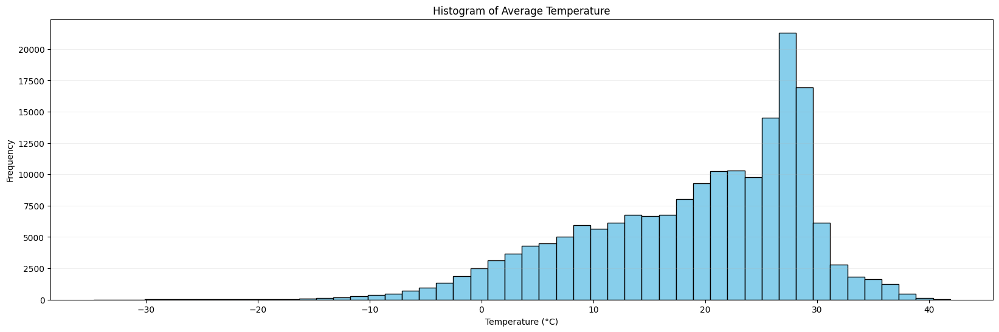

In [49]:
# Histogram of Average Temperature
plt.figure(figsize=(20, 6))
plt.hist(data['avg_temp_c'], bins=50, color='skyblue', edgecolor='black')
plt.title('Histogram of Average Temperature')
plt.xlabel('Temperature (°C)')
plt.ylabel('Frequency')
plt.grid(axis='y', alpha=0.2)
plt.show()

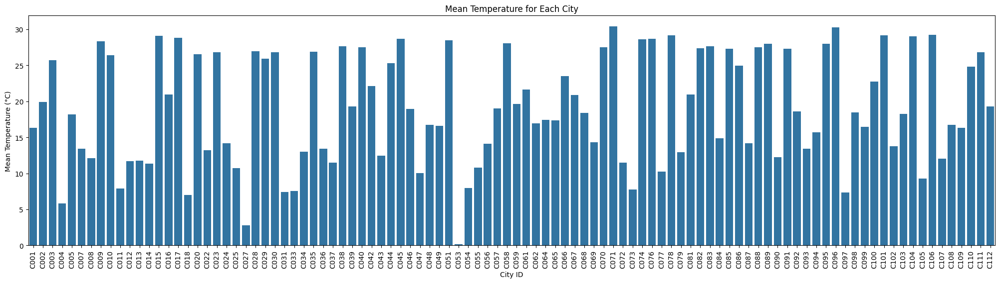

In [50]:
# Calculate the mean temperature for each city
mean_temperatures = data.groupby('city_id')['avg_temp_c'].mean().reset_index()

# Set the size of the plot
plt.figure(figsize=(25, 6))

# Create a bar plot
sns.barplot(x='city_id', y='avg_temp_c', data=mean_temperatures)

# Add labels and title
plt.xlabel('City ID')
plt.ylabel('Mean Temperature (°C)')
plt.title('Mean Temperature for Each City')

# Rotate the x-axis labels
plt.xticks(rotation=90)

plt.show()

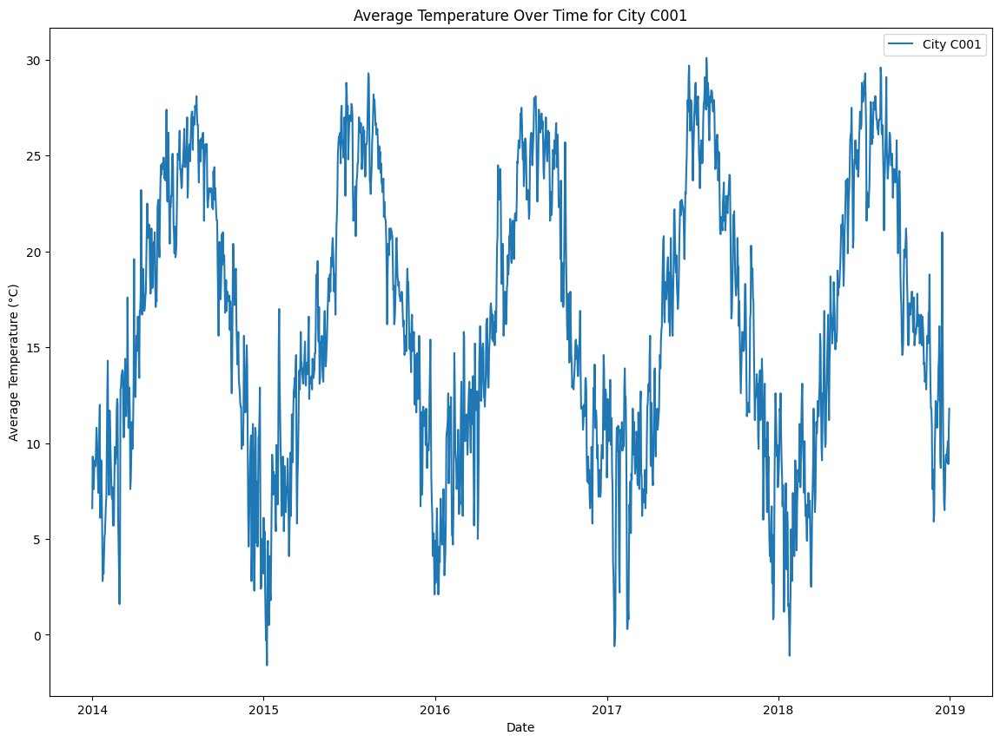

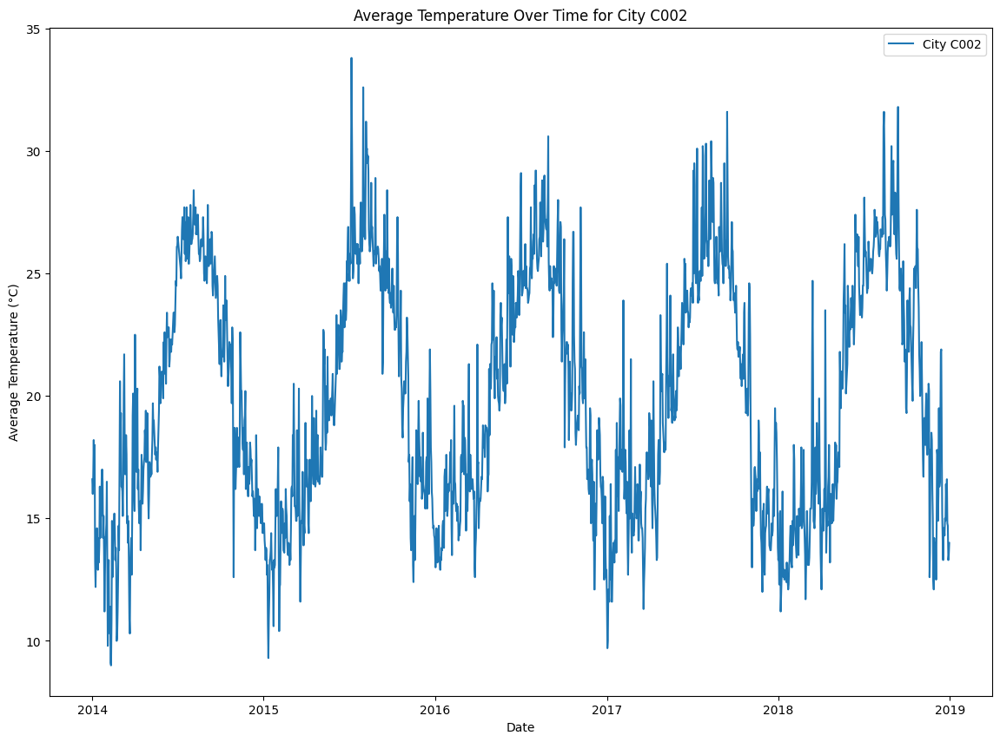

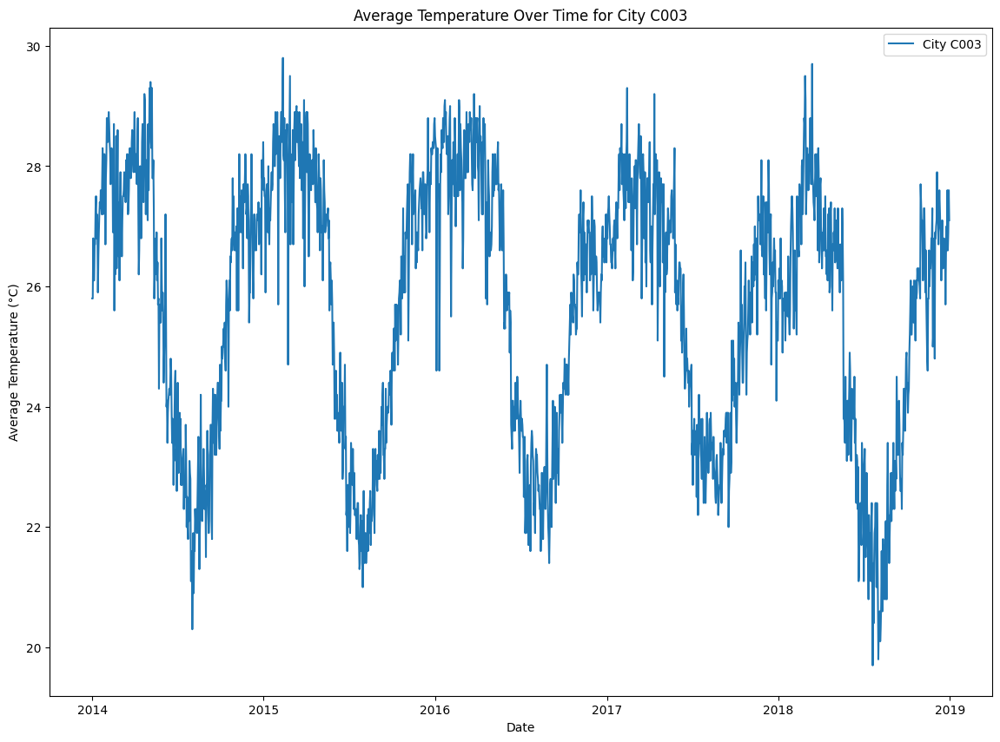

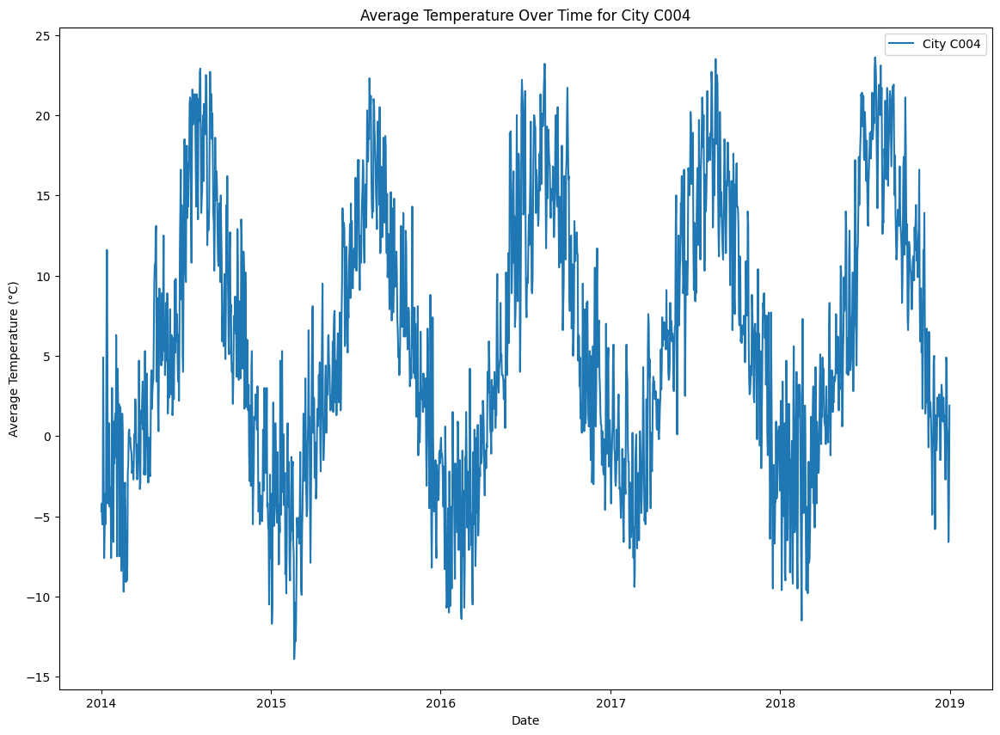

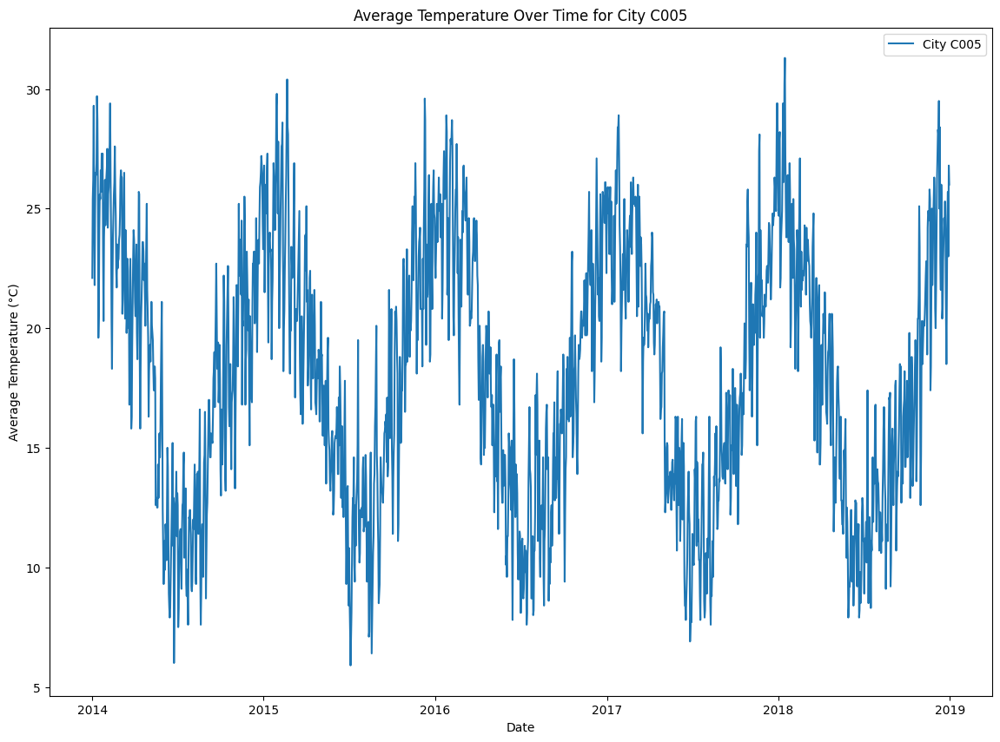

...

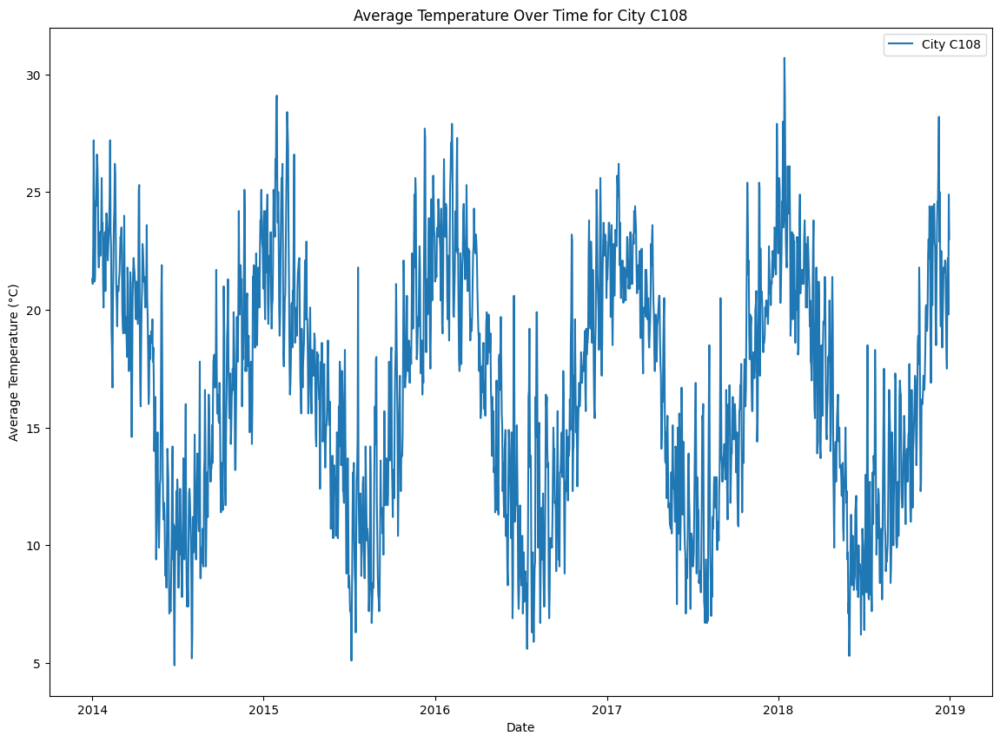

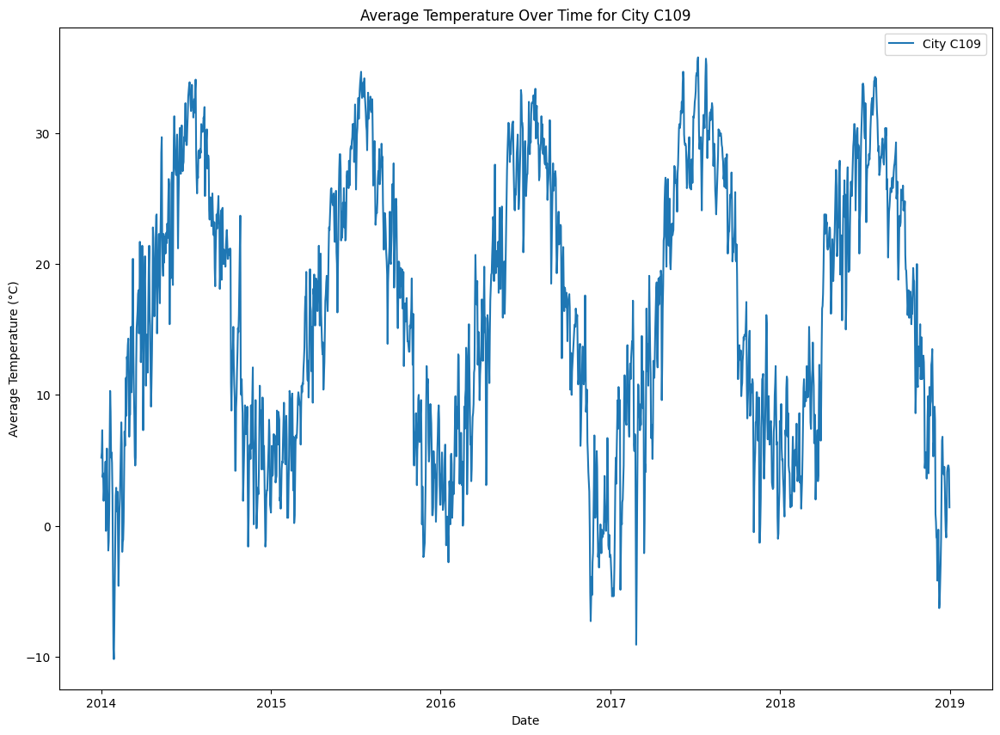

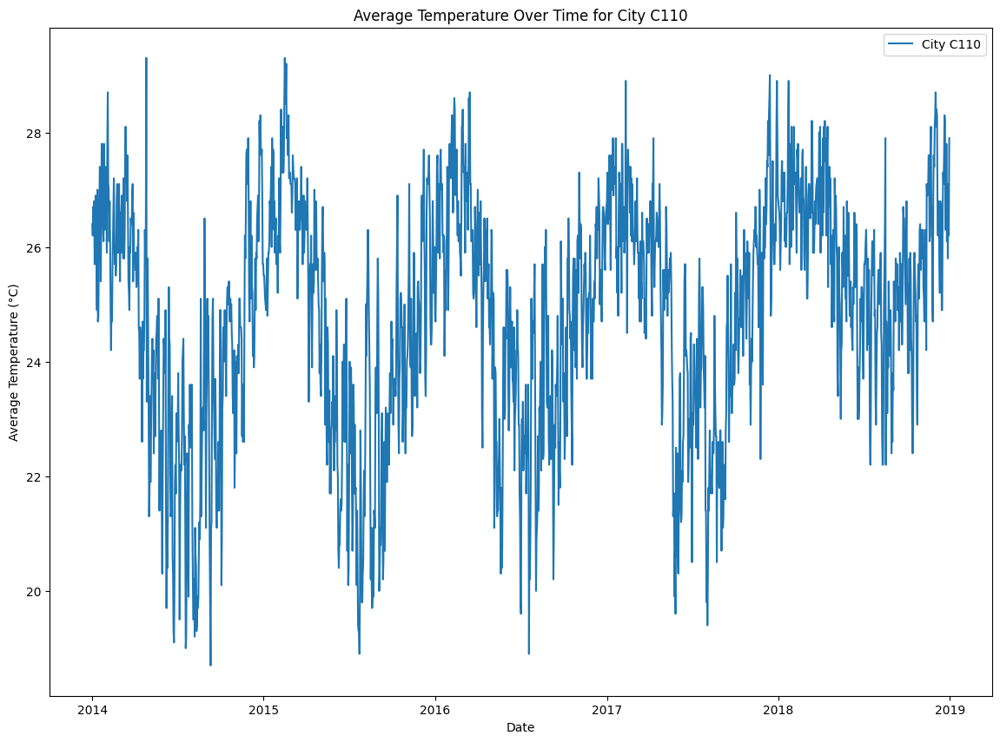

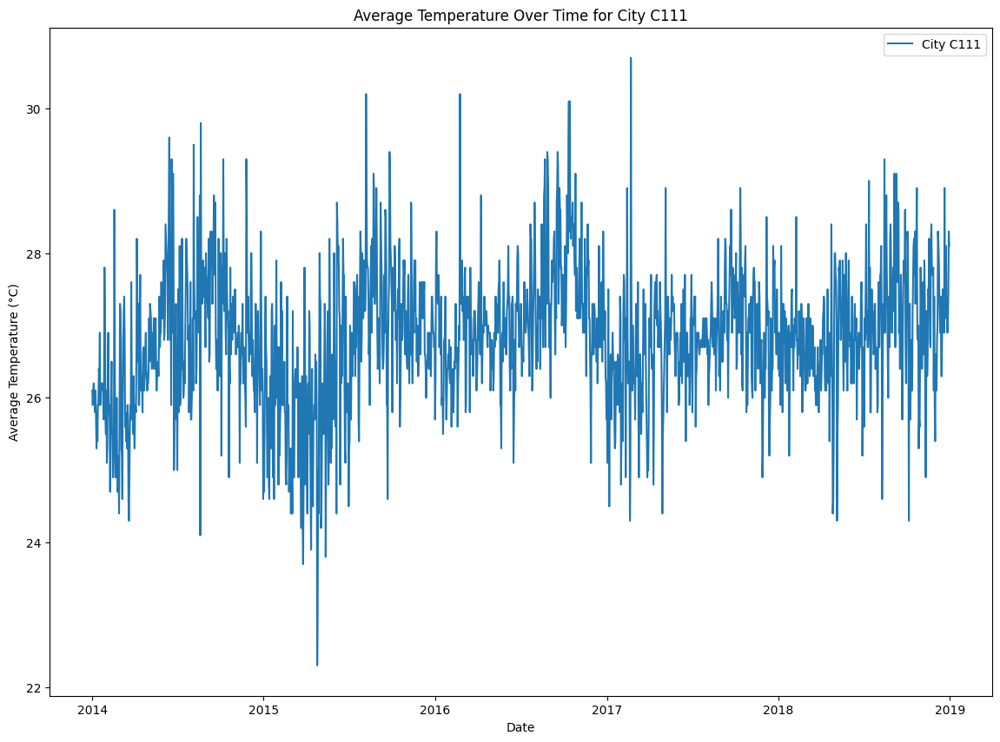

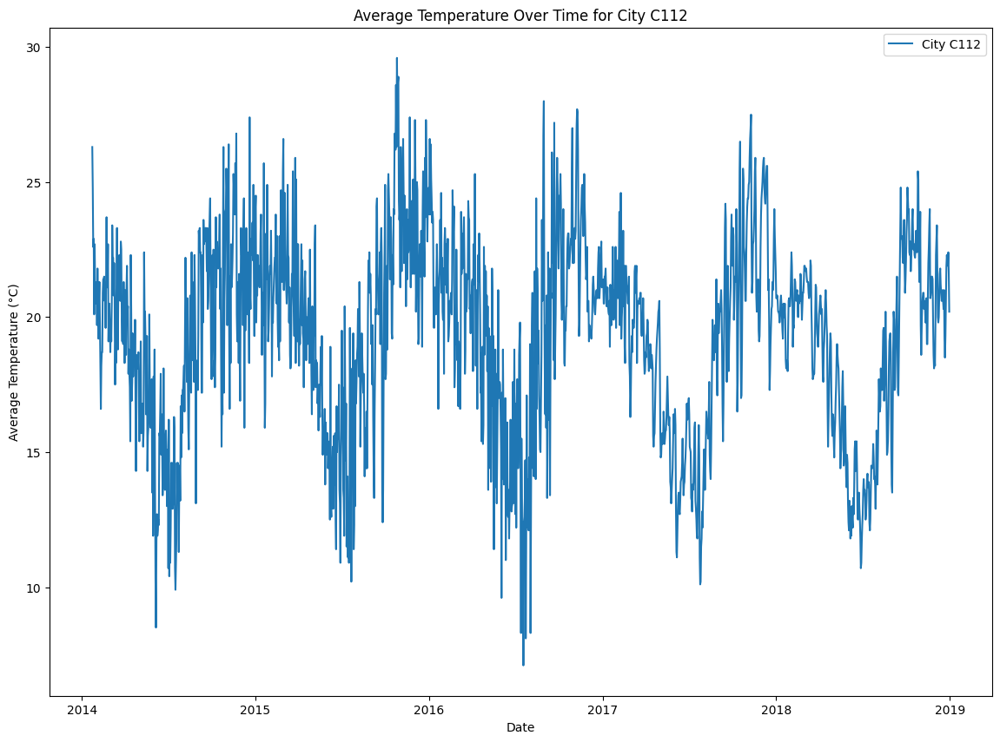

In [51]:
for city_id in data['city_id'].unique():
    plt.figure(figsize=(14, 10))
    # Filter data for the current city
    city_data = data[data['city_id'] == city_id]

    # Plot date vs avg_temp_c
    plt.plot(city_data['date'], city_data['avg_temp_c'], label=f'City {city_id}')

    # Add labels and title
    plt.xlabel('Date')
    plt.ylabel('Average Temperature (°C)')
    plt.title(f'Average Temperature Over Time for City {city_id}')
    plt.legend()
    plt.show()
    print('\n')

In [52]:
# Function for outliers
def outliers(df, city_id):
    # Filter the DataFrame for the given city
    city_data = df[df['city_id'] == city_id]

    # Box plot for 'avg_temp_c' in the given city
    plt.figure(figsize=(8, 6))
    plt.boxplot(city_data['avg_temp_c'], vert=False)
    plt.title(f'Box Plot of Average Temperature in City {city_id}')
    plt.xlabel('Temperature (°C)')
    plt.show()

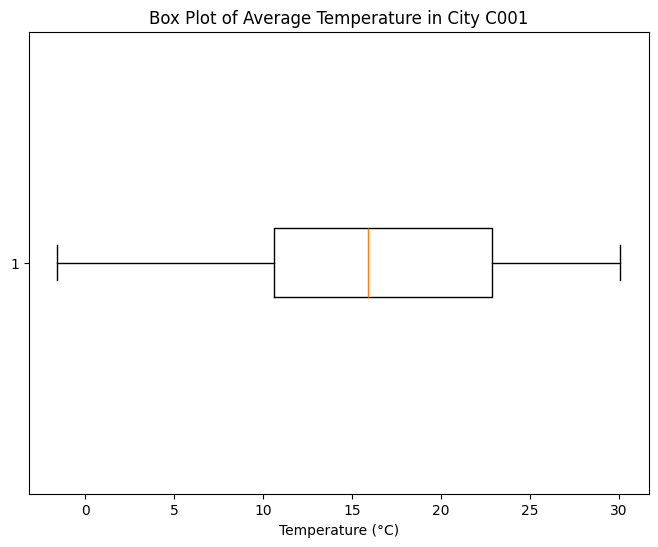

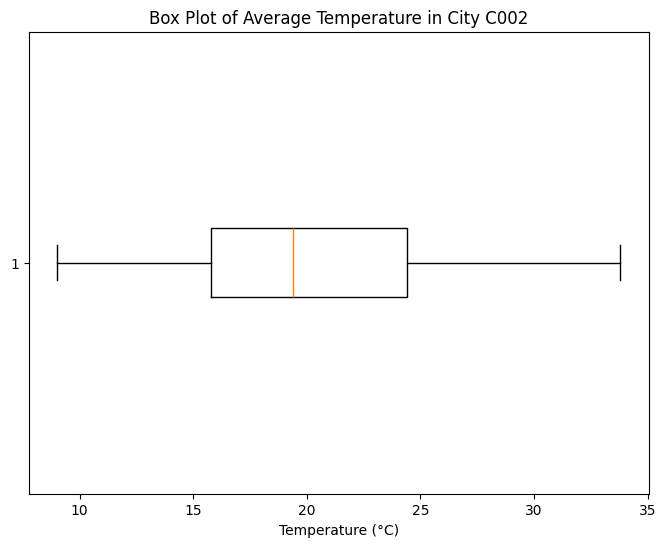

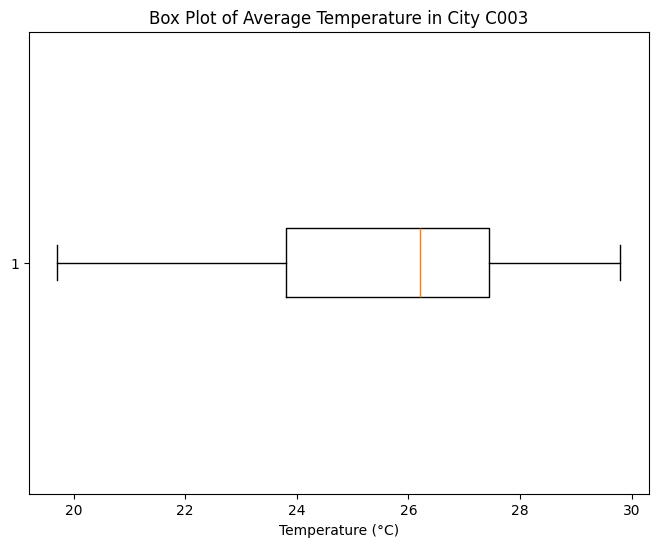

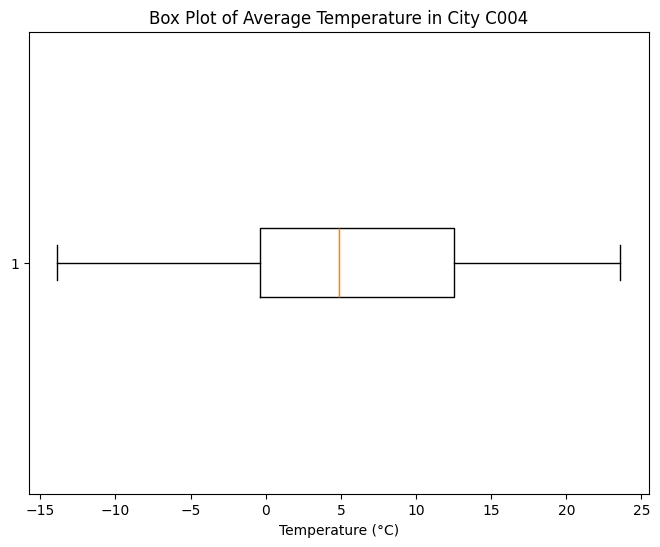

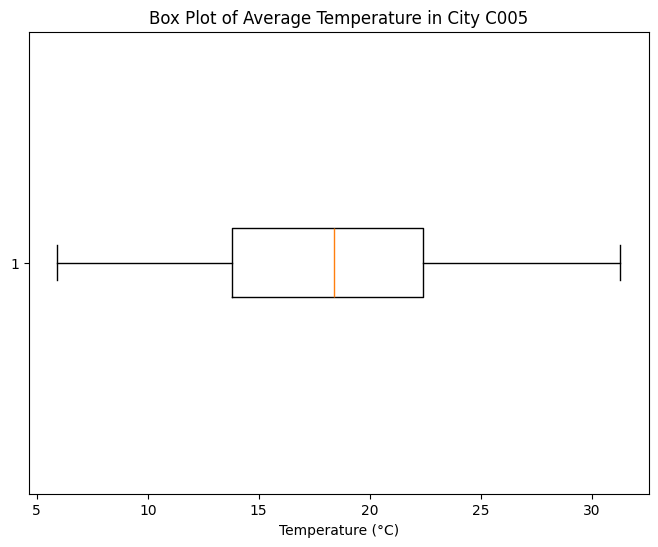

...

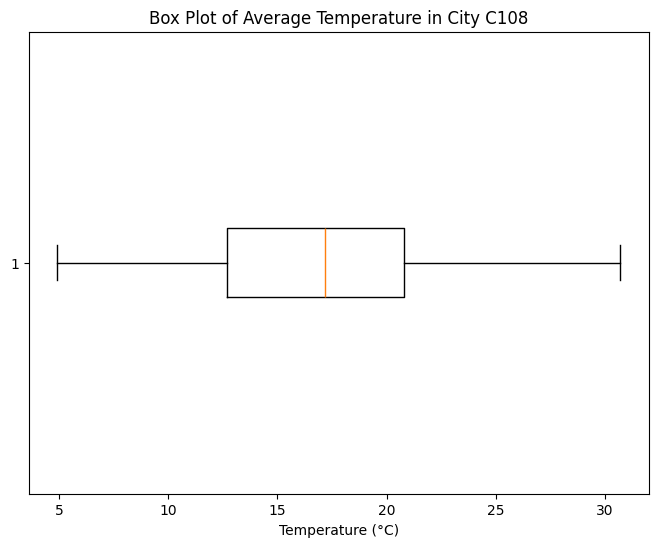

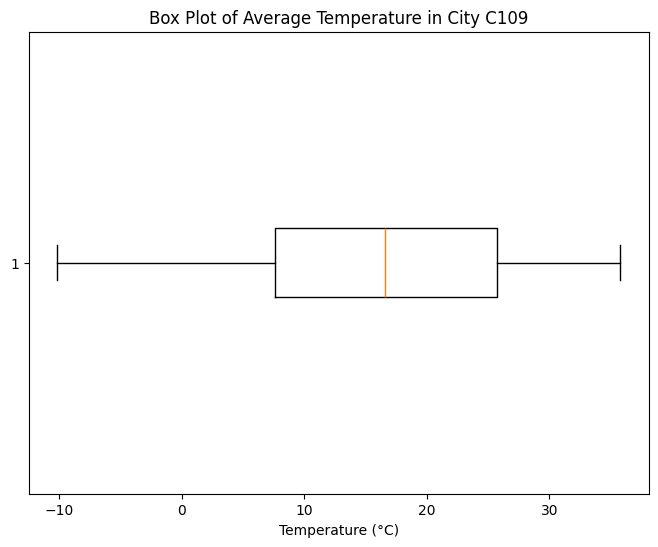

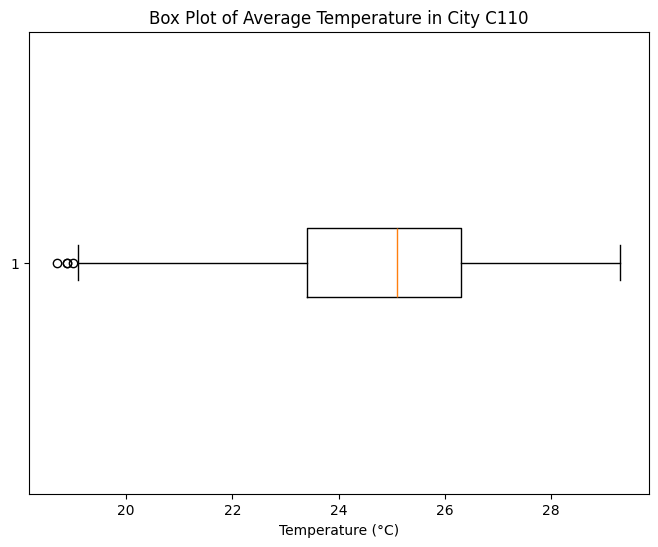

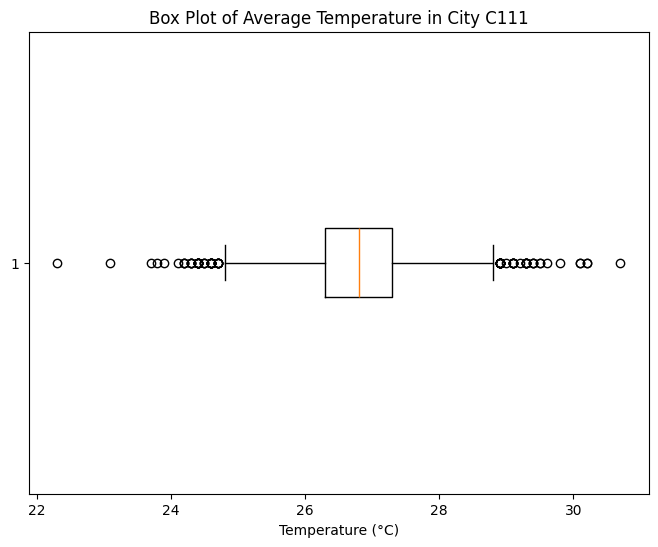

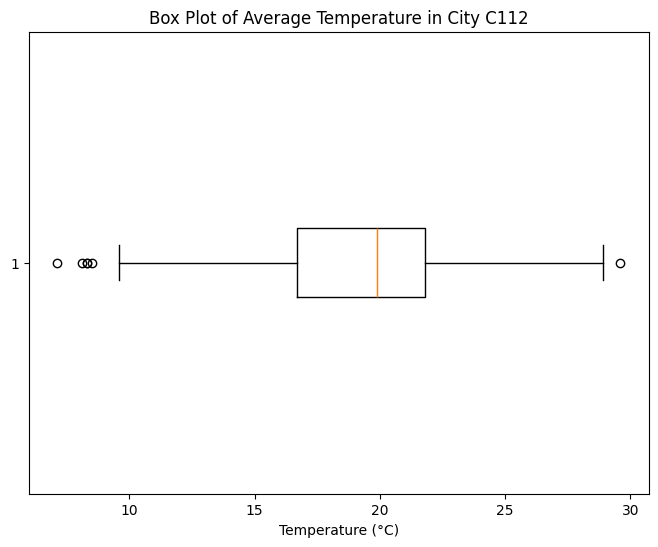

In [53]:
city_ids = data['city_id'].unique().tolist()
for city_id in city_ids:
    outliers(data, city_id)

## Descriptive Statistics

In [59]:
# Group by city and calculate descriptive statistics for avg_temp_c
descriptive_stats = data.groupby('city_id')['avg_temp_c'].agg(['mean', 'median', 'std', 'min', 'max'])

#To display all 100 rows without truncating
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

print("Descriptive Statistics for Average Temperature by City:")
print('\n')
print(descriptive_stats)

Descriptive Statistics for Average Temperature by City:


              mean  median        std   min   max
city_id                                          
C001     16.298905   15.90   7.209946  -1.6  30.1
C002     19.910649   19.40   4.858959   9.0  33.8
C003     25.680307   26.20   2.167799  19.7  29.8
C004      5.828039    4.90   8.145373 -13.9  23.6
C005     18.149452   18.40   5.335747   5.9  31.3
C007     13.420822   13.30   6.114442   0.3  34.0
C008     12.125356   11.95   8.007225  -9.6  29.1
C009     28.350602   29.20   6.632211  12.3  39.4
C010     26.418837   27.90   4.192427  14.1  33.8
C011      7.892004    7.70   9.103256 -20.6  26.5
C012     11.719144   11.50   6.420439  -7.3  30.0
C013     11.744578   12.10   8.208972  -9.2  29.2
C014     11.379682   11.70   8.318465 -10.8  28.0
C015     29.070646   28.60   3.140333  19.9  38.4
C016     20.931414   20.90   1.349186  16.9  24.9
C017     28.828751   28.90   1.549575  21.8  33.3
C018      7.028634    7.80  11.829816 -24.

In [63]:
# Calculate descriptive statistics for the entire dataset
total_stats = data['avg_temp_c'].agg(['mean', 'median', 'std','min','max']).to_frame().T
total_stats.columns = ['mean', 'median', 'std','min','max']

# Percentiles
percentiles = data['avg_temp_c'].quantile([0.25, 0.5, 0.75])

# Interquartile Range (IQR)
iqr = percentiles[0.75] - percentiles[0.25]

# Variance
data_variance = data['avg_temp_c'].var()

print("\nDescriptive Statistics for the Entire Dataset:\n")
print(total_stats,"\n")
print(f"25th Percentile (Q1): {percentiles[0.25]}")
print(f"50th Percentile (Median): {percentiles[0.5]}")
print(f"75th Percentile (Q3): {percentiles[0.75]}")
print(f"Interquartile Range (IQR): {iqr}")
print(f"Variance: {data_variance}")


Descriptive Statistics for the Entire Dataset:

                mean  median       std   min   max
avg_temp_c  19.06744    21.4  9.934401 -34.7  41.9 

25th Percentile (Q1): 12.3
50th Percentile (Median): 21.4
75th Percentile (Q3): 27.1
Interquartile Range (IQR): 14.8
Variance: 98.69232665536406
